In [10]:
import os
import numpy as np
import time

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
import torchvision

import torch.nn.utils.spectral_norm as spectralnorm
import torchvision
import matplotlib.pyplot as plt
from PIL import Image
from models import *
from utils import *
from helper import *
import seaborn as sns

device = torch.device('cuda' if torch.cuda.is_available else cpu)
from vimeo90k import Vimeo90kDataset, VideoFolder_diffusion
!nvidia-smi


Mon Jan 20 19:45:35 2025       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            On   | 00000000:30:00.0 Off |                    0 |
| N/A   42C    P0    27W /  70W |   6801MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [11]:
def load_ssf_model(model, pre_path):
    model.motion_encoder.load_state_dict(torch.load(pre_path+'/m_enc.pth'))
    model.motion_decoder.load_state_dict(torch.load(pre_path+'/m_dec.pth'))
    model.P_encoder.load_state_dict(torch.load(pre_path+'/p_enc.pth'))
    model.res_encoder.load_state_dict(torch.load(pre_path+'/r_enc.pth'))
    model.res_decoder.load_state_dict(torch.load(pre_path+'/r_dec.pth'))
    return model

In [12]:
def plot_R1_eps_eps(x0, x1, x2, x0_hat, x1_hat_JD, x1_hat_AR, x1_hat_FMD, x2_hat_JD, x2_hat_AR, x2_hat_FMD, eps ,letter):
    fig, axarr = plt.subplots(4,3)
    fig.set_size_inches(10, 15)
    for i in range(4):
        for j in range(3):
            axarr[i,j].axis('off')

    axarr[0,0].set_title(r"$X_1$")
    axarr[0,1].set_title(r"$X_2$")
    axarr[0,2].set_title(r"$X_3$")
    axarr[1,0].set_title(r"$\hat{X}_1$ - 12 bits")
    axarr[1,1].set_title(r"$\hat{X}_2 ~ 0-PLF-JD$ - " + f'{eps} bits')
    axarr[1,2].set_title(r"$\hat{X}_3 ~ 0-PLF-JD$ - " + f'{eps} bits')
    axarr[2,0].set_title(r"$\hat{X}_1$  - 12 bits")
    axarr[2,1].set_title(r"$\hat{X}_2 ~ 0-PLF-FMD$ - "  + f'{eps} bits')
    axarr[2,2].set_title(r"$\hat{X}_3 ~ 0-PLF-FMD$ - "  + f'{eps} bits')
    axarr[3,0].set_title(r"$\hat{X}_1$  - 12 bits")
    axarr[3,1].set_title(r"$\hat{X}_2 ~ 0-PLF-AR$ - "  + f'{eps} bits')
    axarr[3,2].set_title(r"$\hat{X}_3 ~ 0-PLF-AR$ - "  + f'{eps} bits')
    
    x0 = x0.cpu().data.numpy()
    x1 = x1.cpu().data.numpy()
    x2 = x2.cpu().data.numpy()
    x0_hat = x0_hat.squeeze().cpu().data.numpy()
    x1_hat_FMD = x1_hat_FMD.squeeze().cpu().data.numpy()
    x1_hat_JD = x1_hat_JD.squeeze().cpu().data.numpy()
    x1_hat_AR = x1_hat_AR.squeeze().cpu().data.numpy()
    x2_hat_FMD = x2_hat_FMD.squeeze().cpu().data.numpy()
    x2_hat_JD = x2_hat_JD.squeeze().cpu().data.numpy()
    x2_hat_AR = x2_hat_AR.squeeze().cpu().data.numpy()
    
    axarr[0,0].imshow(x0, cmap = 'gray')
    axarr[0,1].imshow(x1, cmap = 'gray')
    axarr[0,2].imshow(x2, cmap = 'gray')
    axarr[1,0].imshow(x0_hat, cmap = 'gray')
    axarr[1,1].imshow(x1_hat_JD, cmap = 'gray')
    axarr[1,2].imshow(x2_hat_JD, cmap = 'gray')
    axarr[2,0].imshow(x0_hat, cmap = 'gray')
    axarr[2,1].imshow(x1_hat_FMD, cmap = 'gray')
    axarr[2,2].imshow(x2_hat_FMD, cmap = 'gray')
    axarr[3,0].imshow(x0_hat, cmap = 'gray')
    axarr[3,1].imshow(x1_hat_AR, cmap = 'gray')
    axarr[3,2].imshow(x2_hat_AR, cmap = 'gray')
    
    plt.imsave(f"./reconstructions/R1-eps/x1{letter}.png", x0, cmap = 'gray')
    plt.imsave(f"./reconstructions/R1-eps/x2{letter}.png", x1, cmap = 'gray')
    plt.imsave(f"./reconstructions/R1-eps/x3{letter}.png", x2, cmap = 'gray')
    plt.imsave(f"./reconstructions/R1-eps/x1{letter}_hat_12.png",x0_hat, cmap = 'gray')
    plt.imsave(f"./reconstructions/R1-eps/x2{letter}_JD_{eps}.png", x1_hat_JD, cmap = 'gray')
    plt.imsave(f"./reconstructions/R1-eps/x2{letter}_FMD_{eps}.png", x1_hat_FMD, cmap = 'gray')
    plt.imsave(f"./reconstructions/R1-eps/x2{letter}_AR_{eps}.png", x1_hat_AR, cmap = 'gray')
    plt.imsave(f"./reconstructions/R1-eps/x3{letter}_JD_{eps}.png", x2_hat_JD, cmap = 'gray')
    plt.imsave(f"./reconstructions/R1-eps/x3{letter}_FMD_{eps}.png", x2_hat_FMD, cmap = 'gray')
    plt.imsave(f"./reconstructions/R1-eps/x3{letter}_AR_{eps}.png", x2_hat_AR, cmap = 'gray')

def R1_eps_eps(x, l_FMD = 0.0 ,l_AR = 0, l_JD = 0, eps = 12, letter = 'a'):
    z_dim = eps//2
    # path to load trained models from
    pre_path_AR_1 = f'./saved_models/R1-eps/{eps}/R1-eps|dim_128|z_dim_{z_dim}|L_2|lambdaJD_0.0|lambdaFMD_0.0|lambdaNEW_{l_AR}|lambdaMSE_1.0'
    pre_path_JD_1 = f'./saved_models/R1-eps/{eps}/R1-eps|dim_128|z_dim_{z_dim}|L_2|lambdaJD_{l_JD}|lambdaFMD_0.0|lambdaNEW_0.0|lambdaMSE_1.0'
    pre_path_FMD_1 = f'./saved_models/R1-eps/{eps}/R1-eps|dim_128|z_dim_{z_dim}|L_2|lambdaJD_0.0|lambdaFMD_{l_FMD}|lambdaNEW_0.0|lambdaMSE_1.0'
    
    pre_path_AR_2 = f'./saved_models/R1-eps-eps/{eps}/12-{eps}-{eps}|lambdaJD_0.0|lambdaFMD_0.0|lambdaAR_{l_AR}|lambdaMSE_1.0|'
    pre_path_JD_2 = f'./saved_models/R1-eps-eps/{eps}/12-{eps}-{eps}|lambdaJD_{l_JD}|lambdaFMD_0.0|lambdaAR_0.0|lambdaMSE_1.0|'
    pre_path_FMD_2 = f'./saved_models/R1-eps-eps/{eps}/12-{eps}-{eps}|lambdaJD_0.0|lambdaFMD_{l_FMD}|lambdaAR_0.0|lambdaMSE_1.0|'

    # load fixed encoder for first frame
    encoder = Encoder(dim=12, nc=1, stochastic=True, quantize_latents=True, L=2).to(device).eval() 
    decoder = Decoder_Iframe(dim=12).to(device).eval()
    decoder_hat = Decoder_Iframe(dim=12).to(device).eval()
    encoder.load_state_dict(torch.load('./I3/I_frame_encoder_zdim_12_L_2.pth'))
    decoder.load_state_dict(torch.load('./I3/I_frame_decoderMMSE_zdim_12_L_2.pth'))
    decoder_hat.load_state_dict(torch.load('./I3/I_frame_decoder_zdim_12_L_2.pth'))

    #load ssf models for second frame
    ssf_AR_1 = ScaleSpaceFlow_R1eps(num_levels=1, dim=z_dim, stochastic=True, quantize_latents=True, L=2).to(device).eval()
    ssf_AR_1 =  load_ssf_model(ssf_AR_1, pre_path_AR_1)

    ssf_JD_1 = ScaleSpaceFlow_R1eps(num_levels=1, dim=z_dim, stochastic=True, quantize_latents=True, L=2).to(device).eval()
    ssf_JD_1 =  load_ssf_model(ssf_JD_1, pre_path_JD_1)
    
    ssf_FMD_1 = ScaleSpaceFlow_R1eps(num_levels=1, dim=z_dim, stochastic=True, quantize_latents=True, L=2).to(device).eval()
    ssf_FMD_1 =  load_ssf_model(ssf_FMD_1, pre_path_FMD_1)
    
    # load ssf models for third frame
    
    ssf_AR_2 =  ScaleSpaceFlow_R1eps_e2e_3frames(num_levels=1, dim=z_dim, stochastic=True, quantize_latents=True, L=2, single_bit=False,num_c=1, activation=torch.sigmoid).to(device).eval()
    ssf_AR_2 =  load_ssf_model(ssf_AR_2, pre_path_AR_2)
    
    ssf_JD_2 =  ScaleSpaceFlow_R1eps_e2e_3frames(num_levels=1, dim=z_dim, stochastic=True, quantize_latents=True, L=2, single_bit=False,num_c=1, activation=torch.sigmoid).to(device).eval()
    ssf_JD_2 =  load_ssf_model(ssf_JD_2, pre_path_JD_2)
    
    ssf_FMD_2 =  ScaleSpaceFlow_R1eps_e2e_3frames(num_levels=1, dim=z_dim, stochastic=True, quantize_latents=True, L=2, single_bit=False,num_c=1, activation=torch.sigmoid).to(device).eval()
    ssf_FMD_2 =  load_ssf_model(ssf_FMD_2, pre_path_FMD_2)

    # original frames
    x0 = x[0,0,0,:,:]
    x1 = x[0,0,1,:,:]
    x2 = x[0,0,2,:,:]
    
    # first frame
    hx0 = encoder(x[:,:,0,...])[0]
    x0_ref = decoder(hx0)
    x0_hat = decoder_hat(hx0).detach()
    
    #second frame
    x1_hat_JD = ssf_JD_1(x[:,:,0,...], x0_ref, x0_hat)
    x1_hat_AR = ssf_AR_1(x[:,:,0,...], x0_ref, x0_hat)
    x1_hat_FMD = ssf_FMD_1(x[:,:,0,...], x0_ref, x0_hat)
    
    # third frame
    x2_hat_JD = ssf_JD_2(x[:,:,2,...], x1_hat_JD, x[:,:,0,...], x1_hat_JD)
    x2_hat_AR = ssf_AR_2(x[:,:,2,...], x1_hat_AR, x[:,:,0,...], x1_hat_AR)
    x2_hat_FMD = ssf_FMD_2(x[:,:,2,...], x1_hat_FMD, x[:,:,0,...], x1_hat_FMD)

    plot_R1_eps_eps(x0, x1, x2,
                x0_hat[0,0:,:], 
                x1_hat_JD[0,0:,:], 
                x1_hat_AR[0,0:,:],
                x1_hat_FMD[0,0:,:],
                x2_hat_JD[0,0:,:], 
                x2_hat_AR[0,0:,:],
                x2_hat_FMD[0,0:,:],
                eps,
                letter)


In [16]:
loader, _ = get_dataloader(data_root='./data/', seq_len=3, batch_size=64, num_digits=1)
x = next(iter(loader)).permute(0, 4, 1, 2, 3).to(device).float()
R1_eps_eps(x, l_FMD = 0.04 ,l_AR = 0.08, l_JD = 0.08, eps = 12, letter = 'c')

Finished Loading MNIST!
[-1.0, 1.0]
[-1.0, 1.0]


FileNotFoundError: [Errno 2] No such file or directory: './saved_models/R1-eps/12/R1-eps|dim_128|z_dim_6|L_2|lambdaJD_0.0|lambdaFMD_0.0|lambdaNEW_0.08|lambdaMSE_1.0/m_enc.pth'

In [18]:
def plot_or_plf(x_1,x_2,x_3,x_1_hat,x_2_hat,x_3_hat, eps, PLF,letter = 'a'):
    fig, axarr = plt.subplots(2,3)
    fig.set_size_inches(10, 10)

    axarr[0,0].axis('off')
    axarr[0,1].axis('off')
    axarr[0,2].axis('off')
    axarr[1,0].axis('off')
    axarr[1,1].axis('off')
    axarr[1,2].axis('off')



    axarr[0,0].set_title(r"$X_1$")
    axarr[0,1].set_title(r"$X_2$")
    axarr[0,2].set_title(r"$X_3$")
    axarr[1,0].set_title(r"$\hat{X}_1$ - 12 bits")
    axarr[1,1].set_title(r"$\hat{X}_2 $~"+ f" PLF-{PLF} - " + f'{eps} bits')
    axarr[1,2].set_title(r"$\hat{X}_3 $~"+ f" PLF-{PLF} - " + f'{eps} bits')

    axarr[0,0].imshow(x_1.cpu().data.numpy(),cmap = 'gray')
    axarr[0,1].imshow(x_2.cpu().data.numpy(),cmap = 'gray')
    axarr[0,2].imshow(x_3.cpu().data.numpy(),cmap = 'gray')
    axarr[1,0].imshow(x_1_hat.squeeze().cpu().data.numpy(),cmap = 'gray')
    axarr[1,1].imshow(x_2_hat.squeeze().cpu().data.numpy(),cmap = 'gray')
    axarr[1,2].imshow(x_3_hat.squeeze().cpu().data.numpy(),cmap = 'gray')

    plt.imsave(f"./reconstructions/R1-eps/x1{letter}.png", x_1.cpu().data.numpy(),cmap = 'gray')
    plt.imsave(f"./reconstructions/R1-eps/x2{letter}.png", x_2.cpu().data.numpy(),cmap = 'gray')
    plt.imsave(f"./reconstructions/R1-eps/x3{letter}.png", x_3.cpu().data.numpy(),cmap = 'gray')
    plt.imsave(f"./reconstructions/R1-eps/x1{letter}_hat_12.png",x_1_hat.squeeze().cpu().data.numpy(),cmap = 'gray')
    plt.imsave(f"./reconstructions/R1-eps/x2{letter}_{PLF}_{eps}.png", x_2_hat.squeeze().cpu().data.numpy(),cmap = 'gray')
    plt.imsave(f"./reconstructions/R1-eps/x3{letter}_{PLF}_{eps}.png", x_3_hat.squeeze().cpu().data.numpy(),cmap = 'gray')

    

def compare_or_plf(x, PLF = 'NEW', eps = 12, lambda_ = 0.01, gen_x_1_hat = True, x_1_hat = None, x_ref = None, letter = 'a'):
    # path to load trained models from
    z_dim = eps//2
    
    if PLF =='NEW':
        pre_path_1 = f'./saved_models/{eps}/R1-eps|dim_128|z_dim_{z_dim}|L_2|'\
                        + f'lambdaJD_0.0|lambdaFMD_0.0|lambdaNEW_{lambda_}|lambdaMSE_1.0'
        pre_path_2  = f'./saved_models/R1-eps-eps/{eps}/12-{eps}-{eps}|lambdaJD_0.0|'\
                        + f'lambdaFMD_0.0|lambdaAR_{lambda_}|lambdaMSE_1.0|'
    elif PLF =='JD':
        pre_path_1 = f'./saved_models/{eps}/R1-eps|dim_128|z_dim_{z_dim}|L_2|'\
                        + f'lambdaJD_{lambda_}|lambdaFMD_0.0|lambdaNEW_0.0|lambdaMSE_1.0'
        pre_path_2  = f'./saved_models/R1-eps-eps/{eps}/12-{eps}-{eps}|lambdaJD_{lambda_}|'\
                        + f'lambdaFMD_0.0|lambdaAR_0.0|lambdaMSE_1.0|'
    elif PLF =='FMD':
        pre_path_1 = f'./saved_models/{eps}/R1-eps|dim_128|z_dim_{z_dim}|L_2|'\
                + f'lambdaJD_0.0|lambdaFMD_{lambda_}|lambdaNEW_0.0|lambdaMSE_1.0'
        pre_path_2  = f'./saved_models/R1-eps-eps/{eps}/12-{eps}-{eps}|lambdaJD_0.0|'\
                        + f'lambdaFMD_{lambda_}|lambdaAR_0.0|lambdaMSE_1.0|'
        
        
    # load fixed encoder for first frame
    device = torch.device('cuda' if torch.cuda.is_available else cpu)
    if gen_x_1_hat:
        I_dim = 12 
        I_L = 2
        encoder = Encoder(dim=I_dim, nc=1, stochastic=True, quantize_latents=True, L=I_L).to(device).eval() 
        decoder = Decoder_Iframe(dim=I_dim).to(device).eval()
        decoder_hat = Decoder_Iframe(dim=I_dim).to(device).eval()
        encoder.load_state_dict(torch.load('./I3/I_frame_encoder_zdim_12_L_2.pth'))
        decoder.load_state_dict(torch.load('./I3/I_frame_decoderMMSE_zdim_12_L_2.pth'))
        decoder_hat.load_state_dict(torch.load('./I3/I_frame_decoder_zdim_12_L_2.pth'))

    #load ssf models for second frame

    # 
    ssf1 = ScaleSpaceFlow_R1eps(num_levels=1, dim=z_dim, stochastic=True, quantize_latents=True, L=2).to(device).eval()
    ssf1 = load_ssf_model(ssf1, pre_path_1)
    ssf2 = ScaleSpaceFlow_R1eps_e2e_3frames(num_levels=1, dim=z_dim, stochastic=True, quantize_latents=True, L=2,\
                                              single_bit=False,num_c=1, activation=torch.sigmoid).to(device).eval()
    ssf2 = load_ssf_model(ssf2, pre_path_2)

    # original frames
    x_1 = x[0,0,0,:,:]
    x_2 = x[0,0,1,:,:]
    x_3 = x[0,0,2,:,:]
    
    if gen_x_1_hat:
        hx = encoder(x[:,:,0,...])[0]
        x_ref = decoder(hx)
        x_1_hat = decoder_hat(hx).detach()
    
    x_2_hat = ssf1(x[:,:,0,...], x_ref, x_1_hat)
    x_3_hat = ssf2(x[:,:,2,...], x_2_hat, x[:,:,0,...], x_2_hat)
    
    
    plot_or_plf(x_1,x_2,x_3,
                x_1_hat[0,0:,:] ,x_2_hat[0,0:,:] ,x_3_hat[0,0:,:] ,
                eps, PLF,letter=letter)
    
    return x_1_hat, x_ref


Finished Loading MNIST!
[-1.0, 1.0]
[-1.0, 1.0]


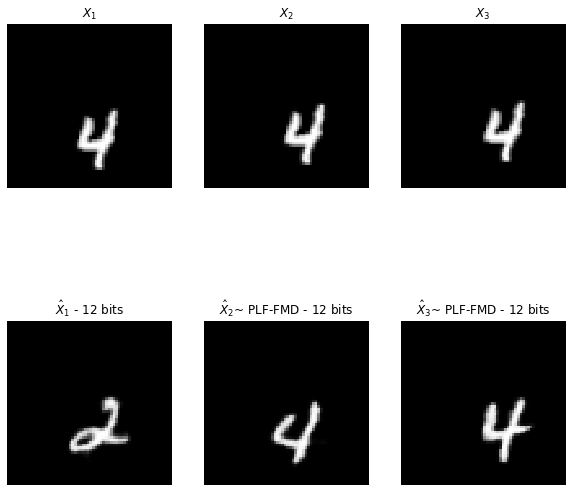

In [87]:
loader, _ = get_dataloader(data_root='./data/', dataset = 'mmnist', seq_len=3, batch_size=64, num_digits=1)
letter = 'f'
#x = next(iter(loader)).permute(0, 4, 1, 2, 3).to(device).float()


x1_hat, x_ref = compare_or_plf(x, PLF = 'FMD', eps = 12, lambda_ = 0.04, gen_x_1_hat = False, x_1_hat = x1_hat, x_ref = x_ref, letter = letter)

In [105]:
def plot_img_series_2(x_1,x_2,x_2_hat_JD, x_2_hat_NEW,x_2_hat_FMD, bitrate):
    fig, axarr = plt.subplots(4,3)
    fig.set_size_inches(10, 15)

    axarr[0,0].axis('off')
    axarr[0,1].axis('off')
    axarr[0,2].axis('off')
    axarr[1,0].axis('off')
    axarr[1,1].axis('off')
    axarr[1,2].axis('off')
    axarr[2,0].axis('off')
    axarr[2,1].axis('off')
    axarr[2,2].axis('off')
    axarr[3,0].axis('off')
    axarr[3,1].axis('off')
    axarr[3,2].axis('off')


    axarr[0,0].set_title(r"$X_1$")
    axarr[0,1].set_title(r"$X_2$")
    axarr[0,2].set_title("original trajectory")
    axarr[1,0].set_title(r"$X_1$ ")
    axarr[1,1].set_title(r"$\hat{X}_2 ~ PLF-JD$ - " + f'{bitrate} bits')
    axarr[1,2].set_title("JD trajectory")
    axarr[2,0].set_title(r"$X_1$")
    axarr[2,1].set_title(r"$\hat{X}_2 ~ PLF-FMD$ - "  + f'{bitrate} bits')
    axarr[2,2].set_title("FMD trajectory")
    axarr[3,0].set_title(r"$X_1$")
    axarr[3,1].set_title(r"$\hat{X}_2 ~ PLF-NEW$ - "  + f'{bitrate} bits')
    axarr[3,2].set_title("NEW trajectory")

    or_t = x_1.squeeze().cpu().data.numpy() + x_2.squeeze().cpu().data.numpy()
    jd_t = x_1.squeeze().cpu().data.numpy() + x_2_hat_JD.squeeze().cpu().data.numpy()
    fmd_t = x_1.squeeze().cpu().data.numpy() + x_2_hat_FMD.squeeze().cpu().data.numpy()
    new_t = x_1.squeeze().cpu().data.numpy() + x_2_hat_NEW.squeeze().cpu().data.numpy()
    
    or_t[or_t>1] = 1
    jd_t[jd_t>1] = 1
    fmd_t[fmd_t>1] = 1
    new_t[new_t>1] = 1
    
    axarr[0,0].imshow(x_1.squeeze().cpu().data.numpy(),cmap = 'gray')
    axarr[0,1].imshow(x_2.squeeze().cpu().data.numpy(),cmap = 'gray')
    axarr[0,2].imshow(or_t, cmap = 'gray')
    
    axarr[1,0].imshow(x_1.squeeze().cpu().data.numpy(),cmap = 'gray')
    axarr[1,1].imshow(x_2_hat_JD.squeeze().cpu().data.numpy(),cmap = 'gray')
    axarr[1,2].imshow(jd_t, cmap = 'gray')
    
    axarr[2,0].imshow(x_1.squeeze().cpu().data.numpy(),cmap = 'gray')
    axarr[2,1].imshow(x_2_hat_FMD.squeeze().cpu().data.numpy(),cmap = 'gray')
    axarr[2,2].imshow(fmd_t, cmap = 'gray')
    
    axarr[3,0].imshow(x_1.squeeze().cpu().data.numpy(),cmap = 'gray')
    axarr[3,1].imshow(x_2_hat_NEW.squeeze().cpu().data.numpy(),cmap = 'gray')
    axarr[3,2].imshow(new_t, cmap = 'gray')
    

In [7]:
def plot_inf_eps_JD_FMD(x_1,x_2,x_2_hat_JD1, x_2_hat_JD2,x_2_hat_FMD1,x_2_hat_FMD2, bitrate):
    fig, axarr = plt.subplots(5,3)
    fig.set_size_inches(10, 15)
    zeros = torch.zeros_like(x_1)
    for i in range(5):
        for j in range(3):
            axarr[i,j].axis('off')

    axarr[0,0].set_title(r"$X_1$")
    axarr[0,1].set_title(r"$X_2$")
    axarr[0,2].set_title("original trajectory")
    axarr[1,0].set_title(r"$X_1$ ")
    axarr[1,1].set_title(r"$\hat{X}_2 ~ PLF-JD 1$ - " + f'{bitrate} bits')
    axarr[1,2].set_title("JD trajectory 1")
    axarr[2,0].set_title(r"$X_1$")
    axarr[2,1].set_title(r"$\hat{X}_2 ~ PLF-JD 2$ - "  + f'{bitrate} bits')
    axarr[2,2].set_title("JD trajectory 2")
    axarr[3,0].set_title(r"$X_1$")
    axarr[3,1].set_title(r"$\hat{X}_2 ~ PLF-FMD 1$ - "  + f'{bitrate} bits')
    axarr[3,2].set_title("FMD trajectory 1")
    axarr[4,0].set_title(r"$X_1$")
    axarr[4,1].set_title(r"$\hat{X}_2 ~ PLF-FMD 2$ - "  + f'{bitrate} bits')
    axarr[4,2].set_title("FMD trajectory 2")
    
    or_t = torch.cat((x_1, x_2, zeros ), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy()
    jd_t1 = torch.cat((x_1, x_2_hat_JD1, zeros ), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy()
    jd_t2 = torch.cat((x_1, x_2_hat_JD2, zeros ), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy()
    fmd_t1 = torch.cat((x_1, x_2_hat_FMD1, zeros ), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy()
    fmd_t2 = torch.cat((x_1, x_2_hat_FMD2, zeros ), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy()

    
    axarr[0,0].imshow(torch.cat((x_1, zeros, zeros), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy())
    axarr[0,1].imshow(torch.cat((zeros, x_2, zeros), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy())
    axarr[0,2].imshow(or_t)
    
    axarr[1,0].imshow(torch.cat((x_1, zeros, zeros), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy())
    axarr[1,1].imshow(torch.cat((zeros, x_2_hat_JD1, zeros), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy())
    axarr[1,2].imshow(jd_t1)
    
    axarr[2,0].imshow(torch.cat((x_1, zeros, zeros), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy())
    axarr[2,1].imshow(torch.cat((zeros, x_2_hat_JD2, zeros), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy())
    axarr[2,2].imshow(jd_t2)
    
    axarr[3,0].imshow(torch.cat((x_1, zeros, zeros), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy())
    axarr[3,1].imshow(torch.cat((zeros, x_2_hat_FMD1, zeros), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy())
    axarr[3,2].imshow(fmd_t1)
    
    axarr[4,0].imshow(torch.cat((x_1, zeros, zeros), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy())
    axarr[4,1].imshow(torch.cat((zeros, x_2_hat_FMD2, zeros), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy())
    axarr[4,2].imshow(fmd_t2)

    
def inf_eps_JD_FMD(lambda_JD = 0.0 ,lambda_FMD = 0.0, eps = 2, x = 0, step =5, dataset = 'mmnist_unidir_4_axis_centered'):
    # path to load trained models from
    pre_path_JD = f'./saved_models/inf-eps/step_{step}/inf-{eps}|lambdaJD_{lambda_JD}|lambdaFMD_0.0|lambdaNEW_0.0|lambdaMSE_1.0|dataset_{dataset}'
    pre_path_FMD = f'./saved_models/inf-eps/step_{step}/inf-{eps}|lambdaJD_0.0|lambdaFMD_{lambda_FMD}|lambdaNEW_0.0|lambdaMSE_1.0|dataset_{dataset}'
    z_dim = eps//2
    #load ssf models for second frame
    
    
    #
    ssf_JD = ScaleSpaceFlow(num_levels=1, dim=z_dim, stochastic=True, quantize_latents=True, L=2).to(device).eval()
    ssf_JD = load_ssf_model(ssf_JD, pre_path_JD)
    
    ssf_FMD = ScaleSpaceFlow(num_levels=1, dim=z_dim, stochastic=True, quantize_latents=True, L=2).to(device).eval()
    ssf_FMD = load_ssf_model(ssf_FMD, pre_path_FMD)
    
    
    # original frames
    x_1 = x[:,:,0,...]
    x_2 = x[:,:,1,...]
    x_2_hat_JD1 = ssf_JD(x_2,x_1)
    x_2_hat_JD2 = ssf_JD(x_2,x_1)
    x_2_hat_FMD1 = ssf_FMD(x_2,x_1)
    x_2_hat_FMD2 = ssf_FMD(x_2,x_1)

    plot_inf_eps_JD_FMD(x_1[0],
                      x_2[0], 
                    x_2_hat_JD1[0,0:,:], 
                    x_2_hat_JD2[0,0:,:],
                    x_2_hat_FMD1[0,0:,:],
                    x_2_hat_FMD2[0,0:,:],
                   eps)

Finished Loading MovingMNIST_4_axis_random_sample_step!
[-1.0, 1.0]
[-1.0, 1.0]


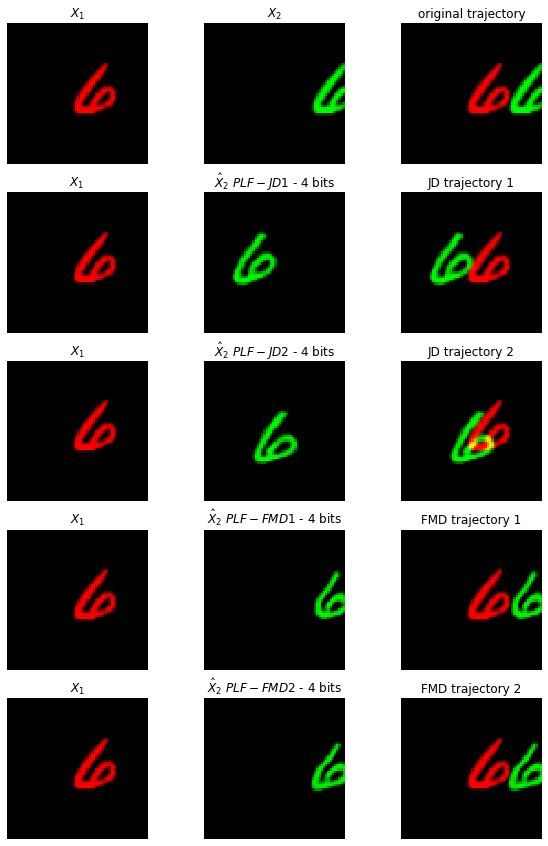

In [11]:
dataset = 'mmnist_4_axis_random_sample_step'
step = 20
loader, _ = get_dataloader(data_root='./data/', dataset = dataset, seq_len = 3, batch_size=64, num_digits=1, step = step)
x = next(iter(loader)).permute(0, 4, 1, 2, 3).to(device).float()
inf_eps_JD_FMD(lambda_JD = 0.2 , lambda_FMD = 0.03 , eps = 4, x = x, step = step, dataset = dataset)

In [13]:
def plot_img_series_FMD(x_1,x_2,x_2_hat_JD1, x_2_hat_JD2,x_2_hat_JD3, bitrate):
    fig, axarr = plt.subplots(4,3)
    fig.set_size_inches(10, 15)

    axarr[0,0].axis('off')
    axarr[0,1].axis('off')
    axarr[0,2].axis('off')
    axarr[1,0].axis('off')
    axarr[1,1].axis('off')
    axarr[1,2].axis('off')
    axarr[2,0].axis('off')
    axarr[2,1].axis('off')
    axarr[2,2].axis('off')
    axarr[3,0].axis('off')
    axarr[3,1].axis('off')
    axarr[3,2].axis('off')


    axarr[0,0].set_title(r"$X_1$")
    axarr[0,1].set_title(r"$X_2$")
    axarr[0,2].set_title("original trajectory")
    axarr[1,0].set_title(r"$X_1$ ")
    axarr[1,1].set_title(r"$\hat{X}_2 ~ PLF-FMD 1$ - " + f'{bitrate} bits')
    axarr[1,2].set_title("JD trajectory 1")
    axarr[2,0].set_title(r"$X_1$")
    axarr[2,1].set_title(r"$\hat{X}_2 ~ PLF-FMD 2$ - "  + f'{bitrate} bits')
    axarr[2,2].set_title("JD trajectory 2")
    axarr[3,0].set_title(r"$X_1$")
    axarr[3,1].set_title(r"$\hat{X}_2 ~ PLF-FMD 3$ - "  + f'{bitrate} bits')
    axarr[3,2].set_title("JD trajectory 3")

    or_t = x_1.squeeze().cpu().data.numpy() + x_2.squeeze().cpu().data.numpy()
    jd1_t = x_1.squeeze().cpu().data.numpy() + x_2_hat_JD1.squeeze().cpu().data.numpy()
    jd2_t = x_1.squeeze().cpu().data.numpy() + x_2_hat_JD2.squeeze().cpu().data.numpy()
    jd3_t = x_1.squeeze().cpu().data.numpy() + x_2_hat_JD3.squeeze().cpu().data.numpy()
    
    or_t[or_t>1] = 1
    jd1_t[jd1_t>1] = 1
    jd2_t[jd2_t>1] = 1
    jd3_t[jd3_t>1] = 1
    
    axarr[0,0].imshow(x_1.squeeze().cpu().data.numpy(),cmap = 'gray')
    axarr[0,1].imshow(x_2.squeeze().cpu().data.numpy(),cmap = 'gray')
    axarr[0,2].imshow(or_t, cmap = 'gray')
    
    axarr[1,0].imshow(x_1.squeeze().cpu().data.numpy(),cmap = 'gray')
    axarr[1,1].imshow(x_2_hat_JD1.squeeze().cpu().data.numpy(),cmap = 'gray')
    axarr[1,2].imshow(jd1_t, cmap = 'gray')
    
    axarr[2,0].imshow(x_1.squeeze().cpu().data.numpy(),cmap = 'gray')
    axarr[2,1].imshow(x_2_hat_JD2.squeeze().cpu().data.numpy(),cmap = 'gray')
    axarr[2,2].imshow(jd2_t, cmap = 'gray')
    
    axarr[3,0].imshow(x_1.squeeze().cpu().data.numpy(),cmap = 'gray')
    axarr[3,1].imshow(x_2_hat_JD3.squeeze().cpu().data.numpy(),cmap = 'gray')
    axarr[3,2].imshow(jd3_t, cmap = 'gray')



def compare_models_FMD(lambda_ = 0.0 , eps = 2, x = 0, step =5):
    # path to load trained models from
    pre_path_FMD = f'./saved_models/inf-eps/step_{step}/inf-{eps}|lambdaJD_0.0|lambdaFMD_{lambda_}|lambdaNEW_0.0|lambdaMSE_1.0'
    z_dim = eps//2
    #load ssf models for second frame
    
    
    # JD
    ssf_FMD = ScaleSpaceFlow(num_levels=1, dim=z_dim, stochastic=True, quantize_latents=True, L=2).to(device).eval()
    ssf_FMD.motion_encoder.load_state_dict(torch.load(pre_path_FMD+'/m_enc.pth'))
    ssf_FMD.motion_decoder.load_state_dict(torch.load(pre_path_FMD+'/m_dec.pth'))
    ssf_FMD.P_encoder.load_state_dict(torch.load(pre_path_FMD+'/p_enc.pth'))
    ssf_FMD.res_encoder.load_state_dict(torch.load(pre_path_FMD+'/r_enc.pth'))
    ssf_FMD.res_decoder.load_state_dict(torch.load(pre_path_FMD+'/r_dec.pth'))
    
    # original frames
    x_1 = x[:,:,0,...]
    x_2 = x[:,:,1,...]
    x_2_hat_FMD1 = ssf_FMD(x_2,x_1)
    x_2_hat_FMD2 = ssf_FMD(x_2,x_1)
    x_2_hat_FMD3 = ssf_FMD(x_2,x_1)

    plot_img_series_FMD(x_1[0],
                      x_2[0], 
                    x_2_hat_FMD1[0,0:,:], 
                    x_2_hat_FMD2[0,0:,:],
                    x_2_hat_FMD3[0,0:,:],
                   eps)

In [14]:
def compare_models_2(lambda_ = 0.0 , eps = 2, x = 0,step=15, stochastic = True):
    # path to load trained models from
    pre_path_NEW = f'./saved_models/inf-eps/step_{step}/inf-{eps}|lambdaJD_0.0|lambdaFMD_0.0|lambdaNEW_{lambda_}|lambdaMSE_1.0'
    pre_path_JD = f'./saved_models/inf-eps/step_{step}/inf-{eps}|lambdaJD_{lambda_}|lambdaFMD_0.0|lambdaNEW_0.0|lambdaMSE_1.0'
    pre_path_FMD = f'./saved_models/inf-eps/step_{step}/inf-{eps}|lambdaJD_0.0|lambdaFMD_{lambda_}|lambdaNEW_0.0|lambdaMSE_1.0'
    z_dim = eps//2
    #load ssf models for second frame
    
    # NEW
    ssf_NEW = ScaleSpaceFlow(num_levels=1, dim=z_dim, stochastic=stochastic, quantize_latents=True, L=2).to(device).eval()
    ssf_NEW.motion_encoder.load_state_dict(torch.load(pre_path_NEW+'/m_enc.pth'))
    ssf_NEW.motion_decoder.load_state_dict(torch.load(pre_path_NEW+'/m_dec.pth'))
    ssf_NEW.P_encoder.load_state_dict(torch.load(pre_path_NEW+'/p_enc.pth'))
    ssf_NEW.res_encoder.load_state_dict(torch.load(pre_path_NEW+'/r_enc.pth'))
    ssf_NEW.res_decoder.load_state_dict(torch.load(pre_path_NEW+'/r_dec.pth'))

    # JD
    ssf_JD = ScaleSpaceFlow(num_levels=1, dim=z_dim, stochastic=True, quantize_latents=True, L=2).to(device).eval()
    ssf_JD.motion_encoder.load_state_dict(torch.load(pre_path_JD+'/m_enc.pth'))
    ssf_JD.motion_decoder.load_state_dict(torch.load(pre_path_JD+'/m_dec.pth'))
    ssf_JD.P_encoder.load_state_dict(torch.load(pre_path_JD+'/p_enc.pth'))
    ssf_JD.res_encoder.load_state_dict(torch.load(pre_path_JD+'/r_enc.pth'))
    ssf_JD.res_decoder.load_state_dict(torch.load(pre_path_JD+'/r_dec.pth'))
    
    # FMD
    ssf_FMD = ScaleSpaceFlow(num_levels=1, dim=z_dim, stochastic=stochastic, quantize_latents=True, L=2).to(device).eval()
    ssf_FMD.motion_encoder.load_state_dict(torch.load(pre_path_FMD+'/m_enc.pth'))
    ssf_FMD.motion_decoder.load_state_dict(torch.load(pre_path_FMD+'/m_dec.pth'))
    ssf_FMD.P_encoder.load_state_dict(torch.load(pre_path_FMD+'/p_enc.pth'))
    ssf_FMD.res_encoder.load_state_dict(torch.load(pre_path_FMD+'/r_enc.pth'))
    ssf_FMD.res_decoder.load_state_dict(torch.load(pre_path_FMD+'/r_dec.pth'))

    # original frames
    x_1 = x[:,:,0,...]
    x_2 = x[:,:,1,...]
    x_2_hat_JD = ssf_JD(x_2,x_1)
    x_2_hat_NEW = ssf_NEW(x_2,x_1)
    x_2_hat_FMD = ssf_FMD(x_2,x_1)

    plot_img_series_2(x_1[0],
                      x_2[0], 
                    x_2_hat_JD[0,0:,:], 
                    x_2_hat_NEW[0,0:,:],
                    x_2_hat_FMD[0,0:,:],
                   eps)


In [30]:

def plot_inf_eps1_eps2(x_0, x_1, x_2, x_1_hat_JD, x_1_hat_NEW, x_1_hat_FMD, x_2_hat_JD, x_2_hat_NEW, x_2_hat_FMD, eps1, eps2,step):
    fig, axarr = plt.subplots(4,4)
    fig.set_size_inches(15, 15)
    zeros = torch.zeros_like(x_0)
    
    for i in range(4):
        for j in range(4):
            axarr[i,j].axis('off')

    axarr[0,0].set_title(r"$X_1$")
    axarr[0,1].set_title(r"$X_2$")
    axarr[0,2].set_title(r"$X_3$")
    axarr[0,3].set_title("original trajectory")
    
    axarr[1,0].set_title(r"$X_1$ ")
    axarr[1,1].set_title(r"$\hat{X}_2 ~ PLF-JD$ - " + f'{eps1} bits')
    axarr[1,2].set_title(r"$\hat{X}_3 ~ PLF-JD$ - " + f'{eps2} bits')
    axarr[1,3].set_title("JD trajectory")
    
    axarr[2,0].set_title(r"$X_1$")
    axarr[2,1].set_title(r"$\hat{X}_2 ~ PLF-NEW$ - "  + f'{eps1} bits')
    axarr[2,2].set_title(r"$\hat{X}_3 ~ PLF-NEW$ - " + f'{eps2} bits')  
    axarr[2,3].set_title("NEW trajectory")
    
    axarr[3,0].set_title(r"$X_1$")
    axarr[3,1].set_title(r"$\hat{X}_2 ~ PLF-FMD$ - "  + f'{eps1} bits')
    axarr[3,2].set_title(r"$\hat{X}_3 ~ PLF-FMD$ - " + f'{eps2} bits')  
    axarr[3,3].set_title("FMD trajectory")

    or_t = torch.cat((x_0, x_1, x_2), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy()
    jd_t = torch.cat((x_0, x_1_hat_JD, x_2_hat_JD), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy()
    new_t = torch.cat((x_0, x_1_hat_NEW, x_2_hat_NEW), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy()
    fmd_t = torch.cat((x_0, x_1_hat_FMD, x_2_hat_FMD), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy()
    
    
    x0_img = torch.cat((x_0, zeros, zeros), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy()
    x1_img = torch.cat((zeros, x_1, zeros), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy()
    x2_img = torch.cat((zeros, zeros, x_2), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy()
    or_t = torch.cat((x_0, x_1, x_2), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy()
    
    x1_JD = torch.cat((zeros,x_1_hat_JD, zeros), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy()
    x2_JD = torch.cat((zeros,zeros, x_2_hat_JD), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy()
    jd_t = torch.cat((x_0, x_1_hat_JD, x_2_hat_JD), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy()
    
    x1_AR = torch.cat((zeros,x_1_hat_NEW, zeros), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy()
    x2_AR = torch.cat((zeros,zeros, x_2_hat_NEW), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy()
    ar_t = torch.cat((x_0, x_1_hat_NEW, x_2_hat_NEW), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy()
    
    x1_FMD = torch.cat((zeros,x_1_hat_FMD, zeros), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy()
    x2_FMD = torch.cat((zeros,zeros, x_2_hat_FMD), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy()
    fmd_t = torch.cat((x_0, x_1_hat_FMD, x_2_hat_FMD), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy() 

    axarr[0,0].imshow(x0_img)
    axarr[0,1].imshow(x1_img)
    axarr[0,2].imshow(x2_img)
    axarr[0,3].imshow(or_t)
    
    axarr[1,0].imshow(x0_img)
    axarr[1,1].imshow(x1_JD)
    axarr[1,2].imshow(x2_JD)
    axarr[1,3].imshow(jd_t)
    
    axarr[2,0].imshow(x0_img)
    axarr[2,1].imshow(x1_AR)
    axarr[2,2].imshow(x2_AR)
    axarr[2,3].imshow(ar_t)
    
    axarr[3,0].imshow(x0_img)
    axarr[3,1].imshow(x1_FMD)
    axarr[3,2].imshow(x2_FMD)
    axarr[3,3].imshow(fmd_t)
    
    save_path = f'./reconstructions/inf-eps1-eps2/inf-{eps1}-{eps2}/step{step}/'
    os.makedirs(save_path, exist_ok=True)
                      
    plt.imsave(save_path + "x0.png", x0_img)
    plt.imsave(save_path + "x1.png", x1_img)
    plt.imsave(save_path + "x2.png", x2_img)
    plt.imsave(save_path + "traj.png", or_t)
    
    plt.imsave(save_path + "x1_JD.png", x1_JD)
    plt.imsave(save_path + "x2_JD.png", x2_JD)
    plt.imsave(save_path + "traj_JD.png", jd_t)
    
    plt.imsave(save_path + "x1_AR.png", x1_AR)
    plt.imsave(save_path + "x2_AR.png", x2_AR)
    plt.imsave(save_path + "traj_AR.png", ar_t)
    
    plt.imsave(save_path + "x1_FMD.png", x1_FMD)
    plt.imsave(save_path + "x2_FMD.png", x2_FMD)
    plt.imsave(save_path + "traj_FMD.png", fmd_t)

    
    
def inf_eps1_eps2(l_JD1 = 0.0, l_JD2=0, l_NEW2=0 ,l_FMD1=0, l_FMD2=0, eps1 = 2,eps2 =8, x = 0,step=20, stochastic = True, save = False, dataset = 'dataset'):
    # set paths
    pre_path_JD1 = f'./saved_models/inf-eps/step_{step}/inf-{eps1}|lambdaJD_{l_JD1}|lambdaFMD_0.0|lambdaNEW_0.0|lambdaMSE_1.0|dataset_{dataset}'
    pre_path_FMD1 = f'./saved_models/inf-eps/step_{step}/inf-{eps1}|lambdaJD_0.0|lambdaFMD_{l_FMD1}|lambdaNEW_0.0|lambdaMSE_1.0|dataset_{dataset}'
    pre_path_JD2 = f'./saved_models/inf-eps1-eps2/step_{step}/inf-{eps1}-{eps2}|lambdaJD_{l_JD2}|lambdaFMD_0.0|lambdaNEW_0.0|lambdaMSE_1.0|dataset_{dataset}'
    pre_path_NEW2 = f'./saved_models/inf-eps1-eps2/step_{step}/inf-{eps1}-{eps2}|lambdaJD_0.0|lambdaFMD_0.0|lambdaNEW_{l_NEW2}|lambdaMSE_1.0|dataset_{dataset}'
    pre_path_FMD2 = f'./saved_models/inf-eps1-eps2/step_{step}/inf-{eps1}-{eps2}|lambdaJD_0.0|lambdaFMD_{l_FMD2}|lambdaNEW_0.0|lambdaMSE_1.0|dataset_{dataset}'
    
    zdim_1 = eps1//2
    zdim_2 = eps2//2
    
    #load models for second frame
    ssf_JD1 = ScaleSpaceFlow(num_levels=1, dim=zdim_1, stochastic=False, quantize_latents=True, L=2).to(device).eval()
    ssf_JD1 = load_ssf_model(ssf_JD1, pre_path_JD1)
    ssf_FMD1 = ScaleSpaceFlow(num_levels=1, dim=zdim_1, stochastic=True, quantize_latents=True, L=2).to(device).eval()
    ssf_FMD1 = load_ssf_model(ssf_FMD1, pre_path_FMD1)
    
    #load models for third frame 
    ssf_JD2 = ScaleSpaceFlow_R1eps_e2e_3frames(num_levels=1, dim=zdim_2, stochastic=True,\
                                               quantize_latents=True, L=2, single_bit=False,num_c=1,\
                                               activation=torch.sigmoid).to(device)
    ssf_NEW2 = ScaleSpaceFlow_R1eps_e2e_3frames(num_levels=1, dim=zdim_2, stochastic=True,\
                                               quantize_latents=True, L=2, single_bit=False,num_c=1,\
                                               activation=torch.sigmoid).to(device)
    ssf_FMD2 = ScaleSpaceFlow_R1eps_e2e_3frames(num_levels=1, dim=zdim_2, stochastic=True,\
                                                quantize_latents=True, L=2, single_bit=False,num_c=1,\
                                                activation=torch.sigmoid).to(device)
    ssf_JD2 = load_ssf_model(ssf_JD2, pre_path_JD2)
    ssf_NEW2 = load_ssf_model(ssf_NEW2, pre_path_NEW2)
    ssf_FMD2 = load_ssf_model(ssf_FMD2, pre_path_FMD2)
    
    # original frames    
    x_0 = x[:,:,0,...]
    x_1 = x[:,:,1,...]
    x_2 = x[:,:,2,...]
    x1_hat_JD = ssf_JD1(x_1, x_0)
    x1_hat_NEW = ssf_JD1(x_1, x_0)
    x1_hat_FMD = ssf_FMD1(x_1,x_0)
    x2_hat_JD = ssf_JD2(x_2, x1_hat_JD, x_0, x1_hat_JD)
    x2_hat_NEW = ssf_NEW2(x_2, x1_hat_NEW, x_0, x1_hat_NEW)
    x2_hat_FMD = ssf_FMD2(x_2, x1_hat_FMD, x_0, x1_hat_FMD)
    
    
    plot_inf_eps1_eps2(x_0[0], x_1[0],x_2[0],
                       x1_hat_JD[0,0:,:],
                       x1_hat_NEW[0,0:,:],
                       x1_hat_FMD[0,0:,:],
                       x2_hat_JD[0,0:,:],
                       x2_hat_NEW[0,0:,:],
                       x2_hat_FMD[0,0:,:],
                       eps1, eps2,step)

Finished Loading MovingMNIST_4_axis_random_sample_step!
[-1.0, 1.0]
[-1.0, 1.0]
[-1.0, 1.0]
[-1.0, 1.0]
[-1.0, 1.0]


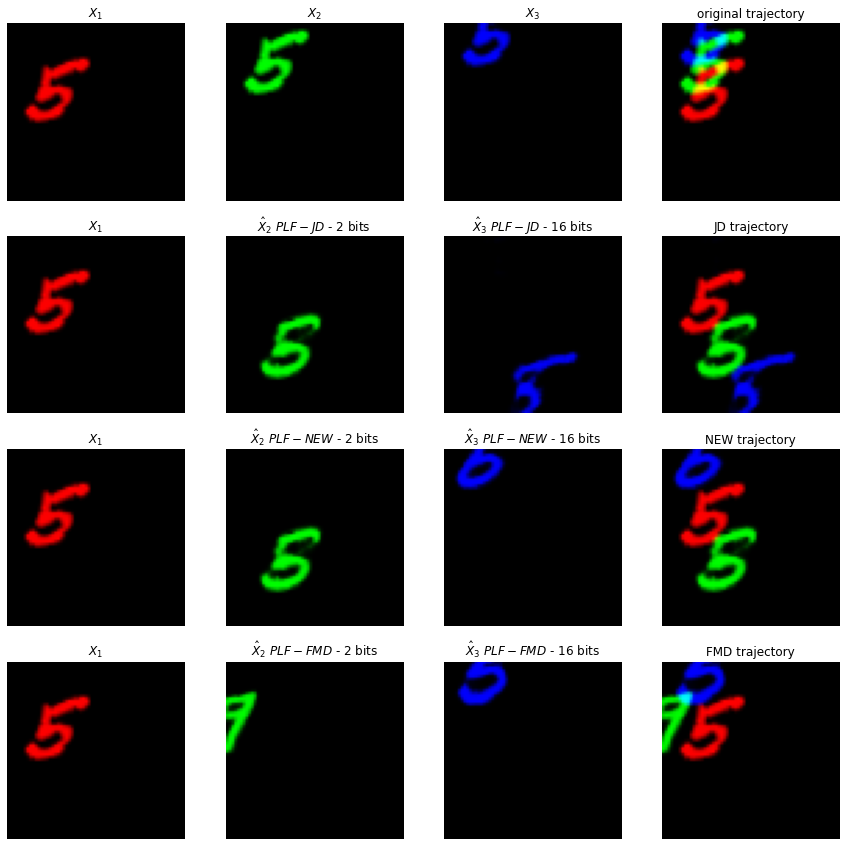

In [31]:
dataset = 'mmnist_4_axis_random_sample_step'
step = 20
loader, _ = get_dataloader(data_root='./data/', dataset = dataset, step = step, seq_len=3, batch_size=64, num_digits=1)
x = next(iter(loader)).permute(0, 4, 1, 2, 3).to(device).float()
inf_eps1_eps2(l_JD1 = 0.2, l_FMD1=0.03, l_JD2=0.2, l_NEW2=0.2, l_FMD2=0.03, eps1 = 2, eps2 =16, x=x, step=step, dataset = dataset)

In [11]:
def plot_batch_seq(seq_len,bs, dataset, step = [15,10]):
    loader, _ = get_dataloader(data_root='./data/', dataset = dataset, seq_len=seq_len, batch_size=bs, num_digits=1, step = step)
    x = next(iter(loader)).permute(0, 4, 1, 2, 3).to(device).float()
    print(x.shape)
    x0 = x[:,:,0,...]
    x1 = x[:,:,1,...]
    print(torch.cat((x0, x1), dim = 1).shape)
    fig, axarr = plt.subplots(bs,seq_len+1)
    fig.set_size_inches(4*(seq_len+1), 4* bs)
    zeros = torch.zeros_like(x[0,:,0,...])
    for i in range(x.shape[0]):
        for j in range(seq_len+1):
            axarr[i,j].axis('off') 
        axarr[i,0].imshow(torch.cat((x[i,:,0,...], zeros, zeros), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy())
        axarr[i,1].imshow(torch.cat((zeros,x[i,:,1,...], zeros), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy())
        axarr[i,2].imshow(torch.cat((zeros,zeros, x[i,:,2,...]), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy())
        axarr[i,3].imshow(torch.cat((x[i,:,0,...], x[i,:,1,...], x[i,:,2,...]), dim=0).squeeze().cpu().data.permute(1, 2, 0).numpy())

In [177]:
plot_batch_seq(3,64, 'mmnist_4_axis_random_sample_step',step = 20)

In [2]:
import numpy as np
from torch.autograd import Variable
import torch.autograd as autograd
device = torch.device('cuda' if torch.cuda.is_available else cpu)
from models import Discriminator_v3
from ssf_model import ScaleSpaceFlow
import time

LAMBDA_GP = 50
LAMBDA_MSE = 1
EPOCHS = 50

def load_ssf_model(model, pre_path):
    model.motion_encoder.load_state_dict(torch.load(pre_path+'/m_enc.pth'))
    model.motion_decoder.load_state_dict(torch.load(pre_path+'/m_dec.pth'))
    model.P_encoder.load_state_dict(torch.load(pre_path+'/p_enc.pth'))
    model.res_encoder.load_state_dict(torch.load(pre_path+'/r_enc.pth'))
    model.res_decoder.load_state_dict(torch.load(pre_path+'/r_dec.pth'))
    return model

def compute_gradient_penalty(D, real_samples, fake_samples):
    """Calculates the gradient penalty loss for WGAN GP"""
    # Random weight term for interpolation between real and fake samples
    alpha = Tensor(np.random.random((real_samples.size(0),  1, 1, 1)))
    # Get random interpolation between real and fake samples
    interpolates = (alpha * real_samples + ((1 - alpha) * fake_samples)).requires_grad_(True)
    d_interpolates = D(interpolates)
    fake = Variable(Tensor(real_samples.shape[0], 1).fill_(1.0), requires_grad=False)
    # Get gradient w.r.t. interpolates
    gradients = autograd.grad(
        outputs=d_interpolates,
        inputs=interpolates,
        grad_outputs=fake[:],
        create_graph=True,
        retain_graph=True,
        only_inputs=True,
    )[0]
    gradients = gradients.view(gradients.size(0), -1)
    gradient_penalty = ((gradients.norm(2, dim=1) - 1) ** 2).mean()
    return gradient_penalty

train_transforms = transforms.Compose(
        [transforms.ToTensor(), transforms.RandomCrop(256)])

train_dataset = VideoFolder_diffusion(
        "./data/vimeo-90k/vimeo_triplet/",
        rnd_interval=False,
        rnd_temp_order=False,
        split="train",
        transform=train_transforms)

train_dataloader = DataLoader(
        train_dataset,
        batch_size=64,
        shuffle=True,
        pin_memory=True)

discriminator_AR = Discriminator_v3(ch=256, out_ch=6).to(device)
discriminator_AR.load_state_dict(torch.load('./saved_models/vimeo-90k/discriminator_AR.pth'))
#ssf = ScaleSpaceFlow(num_levels=1, dim=24, stochastic=True, quantize_latents=True, L=16).to(device)
ssf = ScaleSpaceFlow().to(device)
ssf = load_ssf_model(ssf, './saved_models/vimeo-90k/')
opt_AR = torch.optim.Adam(discriminator_AR.parameters(), lr=1e-5)
opt_ssf = torch.optim.Adam(ssf.parameters(), lr=5e-5)
mse = torch.nn.MSELoss()

a = time.time()
for epoch in range(EPOCHS):
    mse_list = []
    AR_list = []
    mse_epoch = 0
    AR_epoch = 0
    ssf.train()
    discriminator_AR.train()
    for i, data in enumerate(train_dataloader):
        if i%100 == 0:
            print(f'batch {i} of {len(train_dataloader)}')
        opt_AR.zero_grad()
        opt_ssf.zero_grad()
        
        x1 = 2*(data[:,0,...]-0.5)
        x2 = 2*(data[:,1,...]-0.5)
        x1_hat = 2*(data[:,3,...]-0.5)
        x1=x1.to(device)
        x2=x2.to(device)
        x1_hat = x1_hat.to(device)
        
        with torch.no_grad():
            x2_hat = ssf([x1_hat, x2])
 
        x1_hat = x1_hat.to(device)
        #change code
        real_vid = torch.cat((x1_hat, x2), dim = 1)
        fake_vid = torch.cat((x1_hat, x2), dim =1)
        real_vid = real_vid[:32]
        fake_vid = fake_vid[32:]
        fake_validity = discriminator_AR(fake_vid.detach())
        real_validity = discriminator_AR(real_vid)
        
        #gradient_penalty = compute_gradient_penalty(discriminator, real_vid.data, fake_vid.data)
        errAR =  -torch.mean(real_validity) + torch.mean(fake_validity) #+ LAMBDA_GP * gradient_penalty
        errAR.backward()
        opt_AR.step()
        AR_list.append(errAR.item())
        #print('AR Loss: ', errAR.item())
        
        if epoch % 1 == 0:
            x2_hat = ssf([x1_hat, x2])
            loss = LAMBDA_MSE*mse(x2_hat, x2)
            mse_list.append(loss.item())
            loss.backward()
            opt_ssf.step()
            
    if epoch % 1 == 0:
        mse_epoch = torch.Tensor(mse_list).mean().item()
    AR_epoch = torch.Tensor(AR_list).mean().item()

    b = time.time()
    run_time = (b-a)/60
    print(f'| EPOCH: {epoch} | MSE LOSS: {mse_epoch}| AR PLF: {AR_epoch} TIME: {run_time} min|')
          
    if epoch % 1 == 0:
        print('saving models...')
        ssf.eval()
        discriminator_AR.eval()
        torch.save(discriminator_AR.state_dict(), os.path.join("./saved_models/vimeo-90k/discriminator_AR.pth"))
        torch.save(ssf.motion_encoder.state_dict(), './saved_models/vimeo-90k/m_enc.pth')
        torch.save(ssf.motion_decoder.state_dict(), './saved_models/vimeo-90k/m_dec.pth')
        torch.save(ssf.P_encoder.state_dict(), './saved_models/vimeo-90k/p_enc.pth')
        torch.save(ssf.res_encoder.state_dict(),'./saved_models/vimeo-90k/r_enc.pth')
        torch.save(ssf.res_decoder.state_dict(), './saved_models/vimeo-90k/r_dec.pth')

batch 0 of 802
batch 100 of 802
batch 200 of 802
batch 300 of 802
batch 400 of 802
batch 500 of 802
batch 600 of 802
batch 700 of 802
batch 800 of 802
| EPOCH: 0 | MSE LOSS: 0.0035481497179716825| AR PLF: 0.020559733733534813 TIME: 44.58722434838613 min|
saving models...
batch 0 of 802
batch 100 of 802
batch 200 of 802
batch 300 of 802
batch 400 of 802
batch 500 of 802
batch 600 of 802
batch 700 of 802
batch 800 of 802
| EPOCH: 1 | MSE LOSS: 0.003238534787669778| AR PLF: -0.63471919298172 TIME: 88.71910341978074 min|
saving models...
batch 0 of 802


KeyboardInterrupt: 

In [25]:
def sample_uvg_dataset(bs,x):
    bs = 64
    fig, axarr = plt.subplots(bs,4)
    fig.set_size_inches(4*3, 4*bs)
    for j in range(4):
        for i in range(bs):
            axarr[i, j].axis('off') 
            axarr[i, j].imshow(x[i,j,...].permute(1, 2, 0))

In [19]:
import numpy as np
from torch.autograd import Variable
import torch.autograd as autograd
device = torch.device('cuda' if torch.cuda.is_available else cpu)
from models import Discriminator_v3
from ssf_model import ScaleSpaceFlow
import time

def load_ssf_model(model, pre_path):
    model.motion_encoder.load_state_dict(torch.load(pre_path+'/m_enc.pth'))
    model.motion_decoder.load_state_dict(torch.load(pre_path+'/m_dec.pth'))
    model.P_encoder.load_state_dict(torch.load(pre_path+'/p_enc.pth'))
    model.res_encoder.load_state_dict(torch.load(pre_path+'/r_enc.pth'))
    model.res_decoder.load_state_dict(torch.load(pre_path+'/r_dec.pth'))
    return model

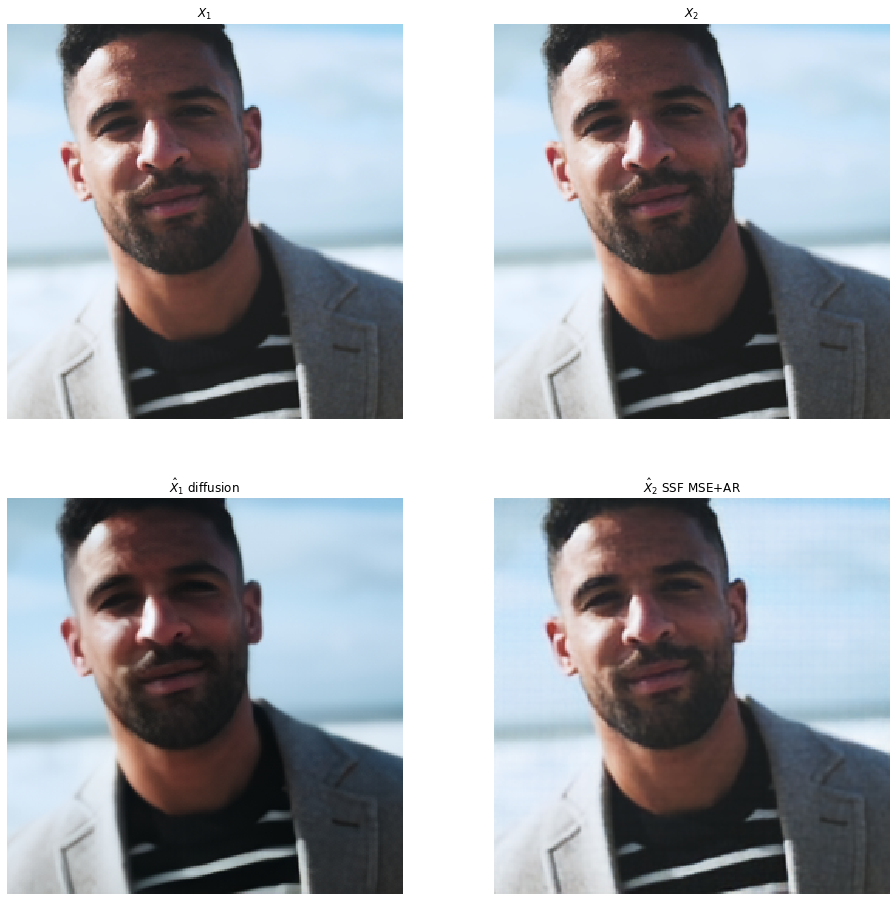

In [29]:
train_transforms = transforms.Compose(
        [transforms.ToTensor(), transforms.RandomCrop(256)])

train_dataset = VideoFolder_diffusion(
        "./data/vimeo-90k/vimeo_triplet/",
        rnd_interval=False,
        rnd_temp_order=False,
        split="train",
        transform=train_transforms)

train_dataloader = DataLoader(
        train_dataset,
        batch_size=64,
        shuffle=True,
        pin_memory=True)
ssf = ScaleSpaceFlow().to(device)
ssf = load_ssf_model(ssf, './saved_models/vimeo-90k/AR_0.16/')

x = next(iter(train_dataloader))
x1 = 2*(x[:,0,...]-0.5)
x2 = 2*(x[:,1,...]-0.5)
x1_hat = 2*(x[:,3,...]-0.5)
x1=x1.to(device)
x2=x2.to(device)
x1_hat = x1_hat.to(device)
ssf.eval()
x2_hat = ssf([x1_hat, x2])
x2_hat = (x2_hat - x2_hat.min()) / (x2_hat.max() - x2_hat.min())
fig, axarr = plt.subplots(2,2)
fig.set_size_inches(16, 16)

#x2_hat = 2*(x2_hat-0.5)
index = np.random.randint(64)
axarr[0,0].axis('off')
axarr[0,1].axis('off')
axarr[1,0].axis('off')
axarr[1,1].axis('off')
axarr[0,0].set_title(r"$X_1$")
axarr[0,1].set_title(r"$X_2$")
axarr[1,0].set_title(r"$\hat{X}_1$ diffusion ")
axarr[1,1].set_title(r"$\hat{X}_2$ SSF MSE+AR")

axarr[0,0].imshow(x[index,0,...].cpu().permute(1,2,0))
axarr[0,1].imshow(x[index,1,...].cpu().permute(1,2,0))
axarr[1,0].imshow(x[index,3,...].cpu().permute(1,2,0))
axarr[1,1].imshow(x2_hat[index].detach().cpu().permute(1,2,0))


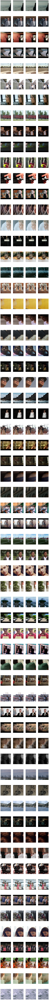

In [26]:
sample_uvg_dataset(64,x)